In [2]:
import pandas as pd
import numpy as np
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt

In [3]:
PRT_ALL = sc.read('SAHA_All_PRT_share.h5ad')
RNA_ALL = sc.read('SAHA_All_RNA_share.h5ad')

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [3]:
print(PRT_ALL.var_names)

Index(['4-1BB', 'B7-H3', 'Bcl-2', 'Beta-catenin', 'CCR7', 'CD11b', 'CD11c',
       'CD123', 'CD127', 'CD138', 'CD14', 'CD15', 'CD16', 'CD163', 'CD19',
       'CD20', 'CD27', 'CD3', 'CD31', 'CD34', 'CD38', 'CD39', 'CD4', 'CD40',
       'CD45', 'CD45RA', 'CD56', 'CD68', 'CD8', 'CTLA4', 'EGFR', 'EpCAM',
       'FABP4', 'FOXP3', 'Fibronectin', 'GITR', 'GZMA', 'GZMB', 'HLA-DR',
       'Her2', 'ICAM1', 'ICOS', 'IDO1', 'IL-18', 'IL-1b', 'IgD', 'Ki-67',
       'LAG3', 'LAMP1', 'Ms IgG1', 'NF-kB p65', 'PD-1', 'PD-L1', 'PD-L2',
       'Rb IgG', 'SMA', 'STING', 'TCF7', 'Tim-3', 'VISTA', 'Vimentin', 'iNOS',
       'p53', 'pan-RAS'],
      dtype='object')


Text(0.5, 1.0, 'SAHA_CR_STO_A1_EC03')

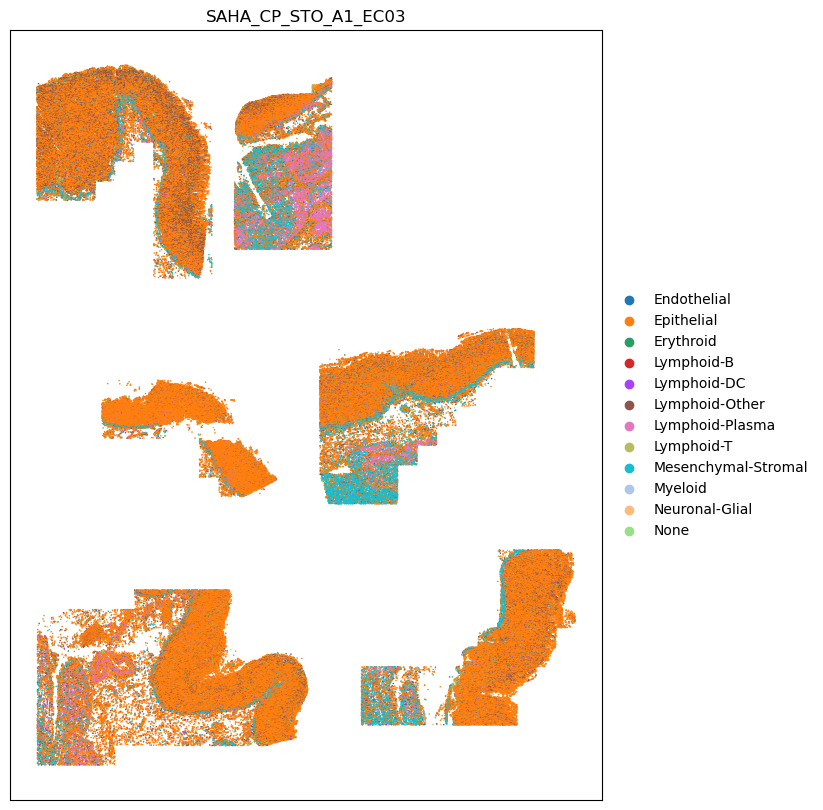

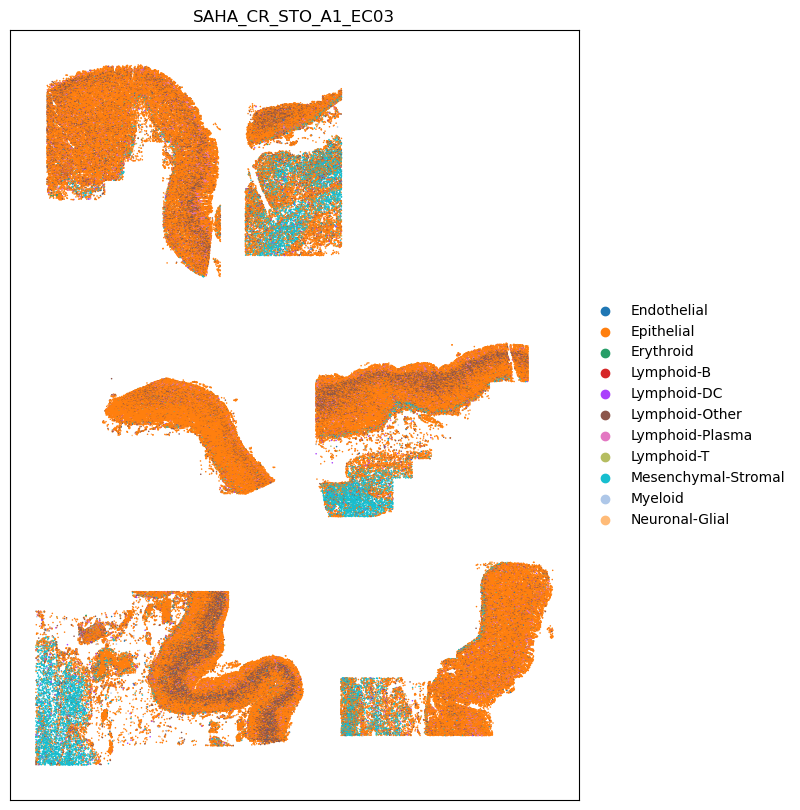

In [3]:
# Stomach
PRT = sc.read('PRT_STO.h5ad')
RNA = sc.read('RNA_STO.h5ad')

PRT_name = 'SAHA_CP_STO_A1_EC03'
RNA_name = 'SAHA_CR_STO_A1_EC03'

PRT = PRT[PRT.obs['SAHA_name']==PRT_name].copy()
RNA = RNA[RNA.obs['SAHA_name']==RNA_name].copy()

PRT.obs['fov'] = PRT_ALL[PRT_ALL.obs['SAHA_name']==PRT_name].obs['fov']
RNA.obs['fov'] = RNA_ALL[RNA_ALL.obs['SAHA_name']==RNA_name].obs['fov']

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(PRT, "spatial", color='celltype_mf', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

RNA.uns['Insitutype_Broad_colors'] = ['#1f77b4', #endo
           '#ff7f0e', #epi
           '#279e68', #ery
           '#d62728', #B
           '#aa40fc', #DC
           '#8c564b', #Other
           '#e377c2', #Plasma
           '#b5bd61', #T
           '#17becf', #Mesen
           '#aec7e8', #Myeloid
           '#ffbb78', #Neuro
           '#ff9896', #Stem
]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(RNA, "spatial", color='Insitutype_Broad', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

/tmp/ipykernel_44322/895383922.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()


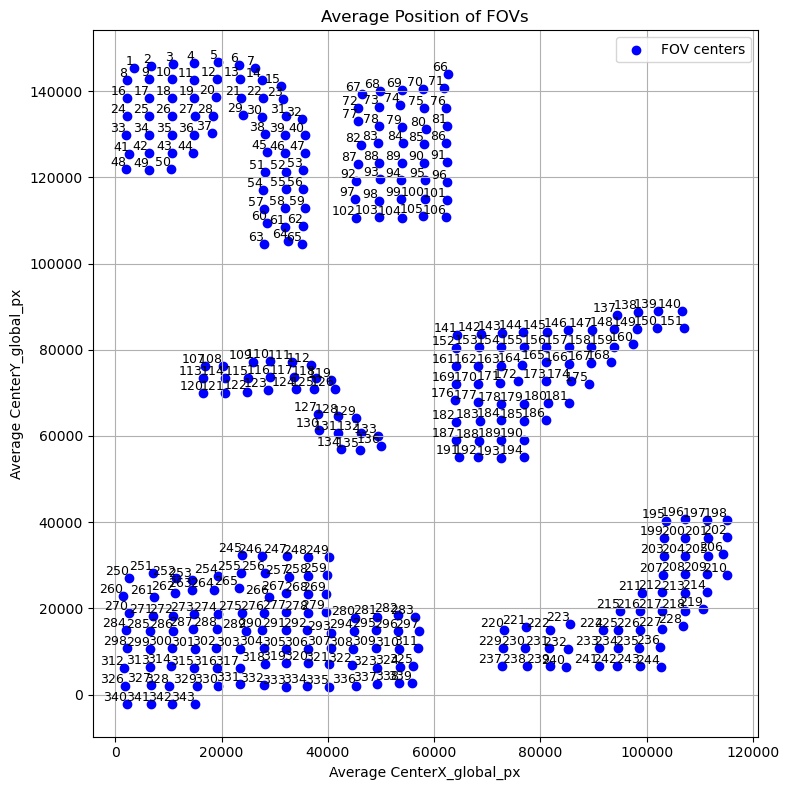

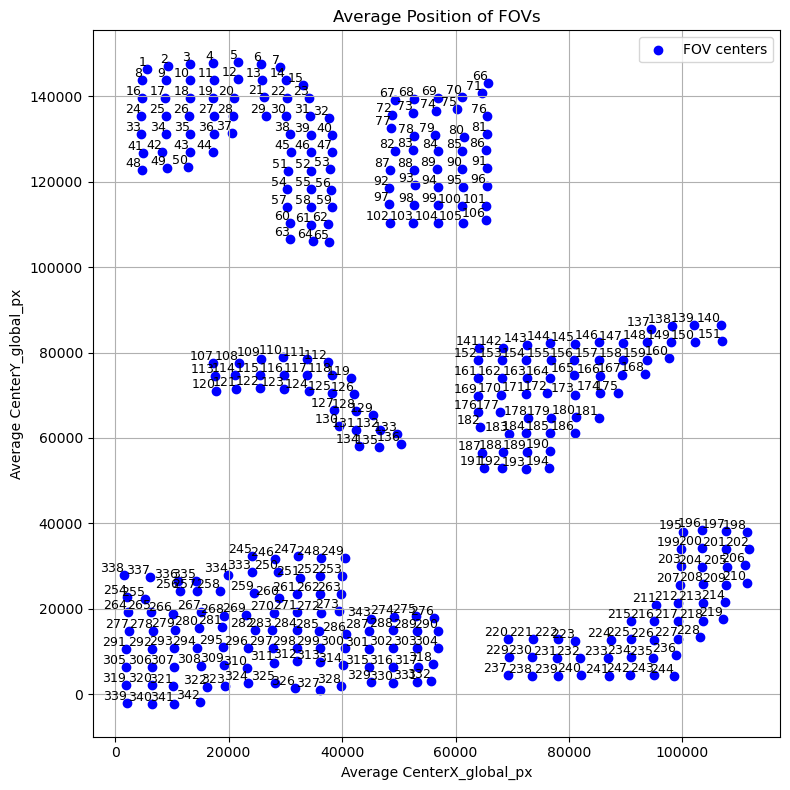

In [4]:
fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

fov_avg_positions = RNA.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


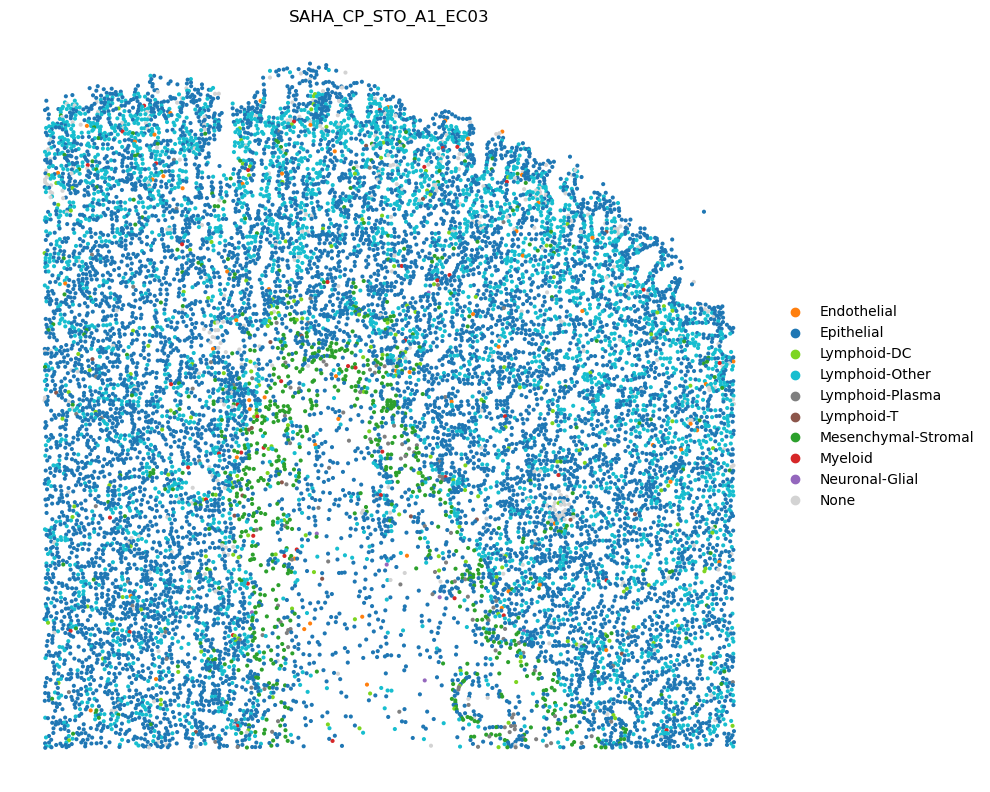

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


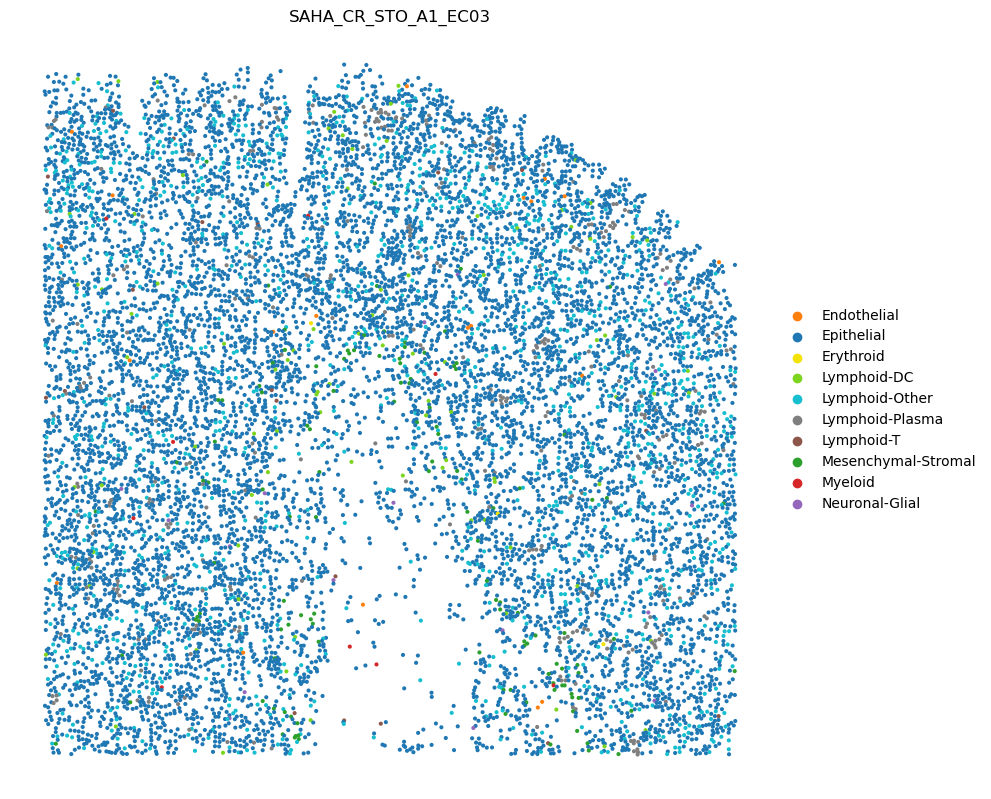

In [7]:
PRT.obs['fov_int'] = pd.to_numeric(PRT.obs['fov'], errors='coerce')
fovs = [4,5,6,7,11,12,13,14,19,20,21,22,27,28,29,30]
size = 35

# Define the color palette you want to use
palette_RNA = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#f2e205', #ery
           '#7DD520', #DC
           '#17becf', #Other
           '#7f7f7f', #Plasma
           '#8c564b', #T
           '#2ca02c', #Mesen
           '#d62728', #Myeloid
           '#9467bd', #Neuro
]

palette_PRT = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#7DD520', #DC
           '#17becf', #Other
           '#7f7f7f', #Plasma
           '#8c564b', #T
           '#2ca02c', #Mesen
           '#d62728', #Myeloid
           '#9467bd', #Neuro
           'lightgray', #None
]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

sc.pl.embedding(PRT[PRT.obs['fov_int'].isin(fovs)], "spatial", color='celltype_mf', ax=ax, s=size, show=False, palette=palette_PRT)
# sc.pl.embedding(PRT[PRT.obs['fov_int'] <= 65], "spatial", color='celltype_mf', ax=ax, s=15, show=False)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("STO_PRT.pdf", format='pdf', bbox_inches='tight')
plt.show()

RNA.obs['fov_int'] = pd.to_numeric(RNA.obs['fov'], errors='coerce')
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

sc.pl.embedding(RNA[RNA.obs['fov_int'].isin(fovs)], "spatial", color='Insitutype_Broad', ax=ax, s=size, show=False, palette=palette_RNA)
# sc.pl.embedding(RNA[RNA.obs['fov_int'] <= 65], "spatial", color='Insitutype_Broad', ax=ax, s=15, show=False, palette=palette)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("STO_RNA.pdf", format='pdf', bbox_inches='tight')
plt.show()

/tmp/ipykernel_779926/431224405.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()


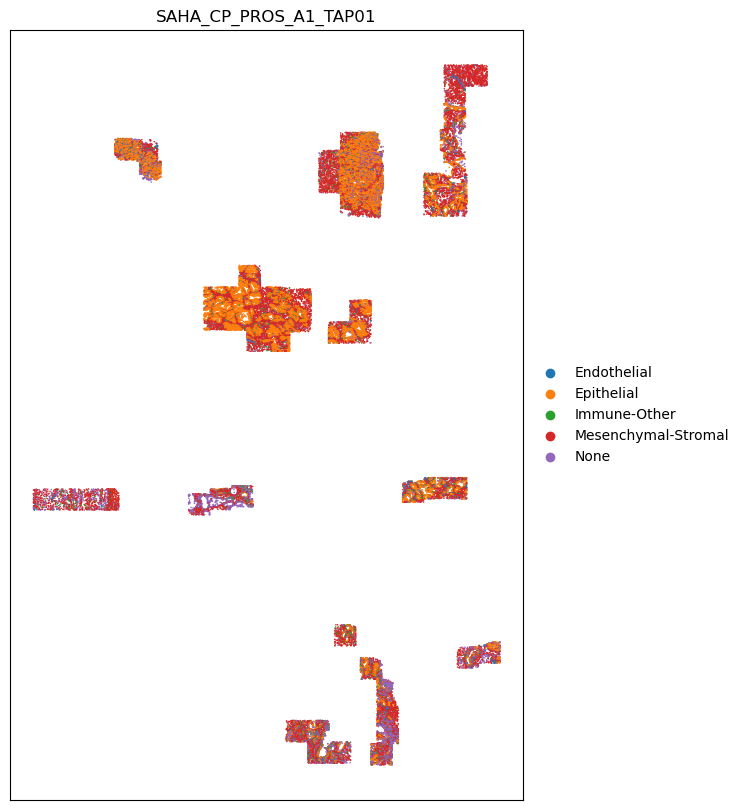

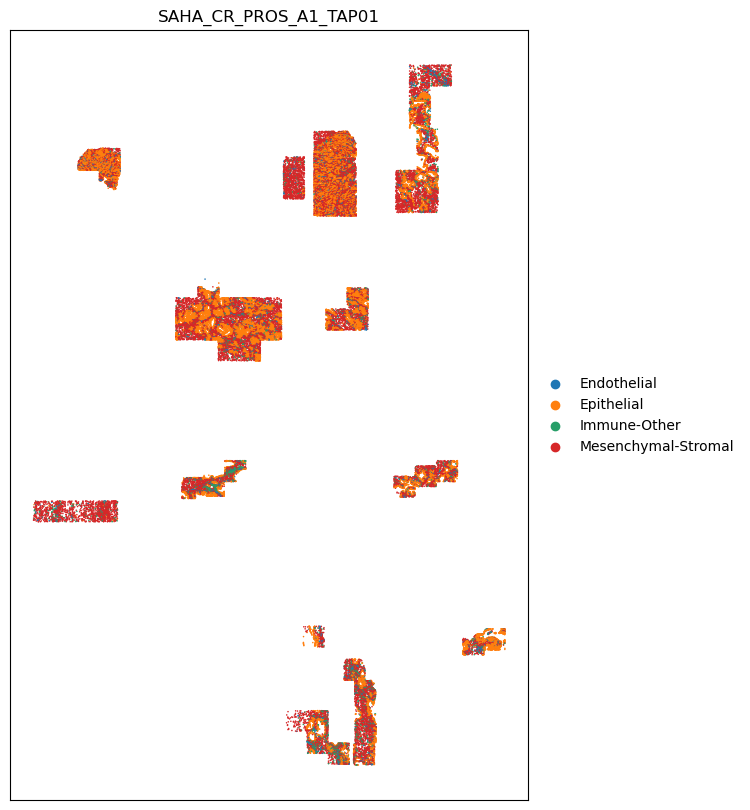

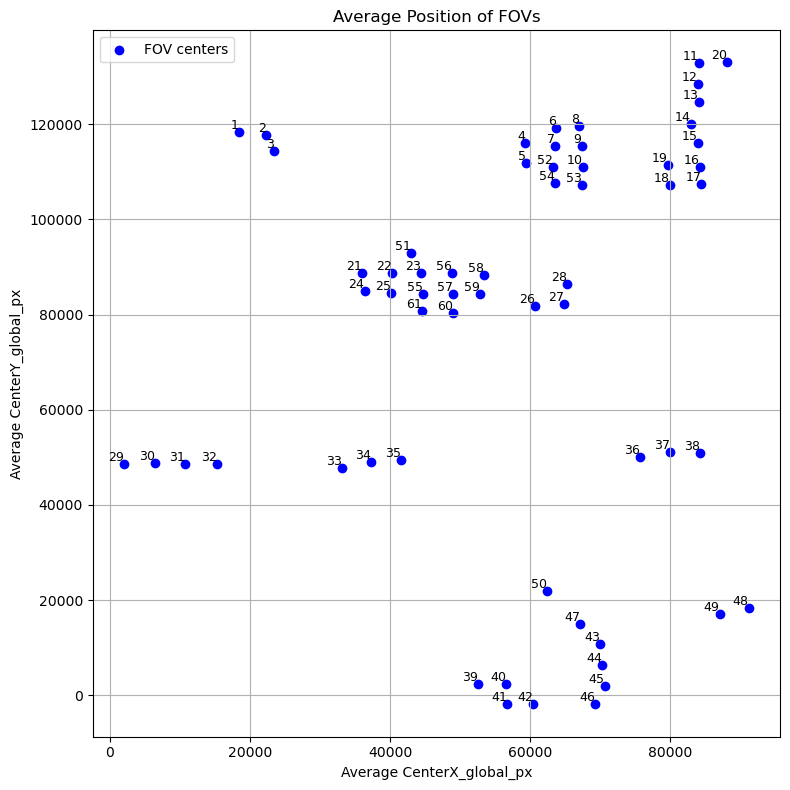

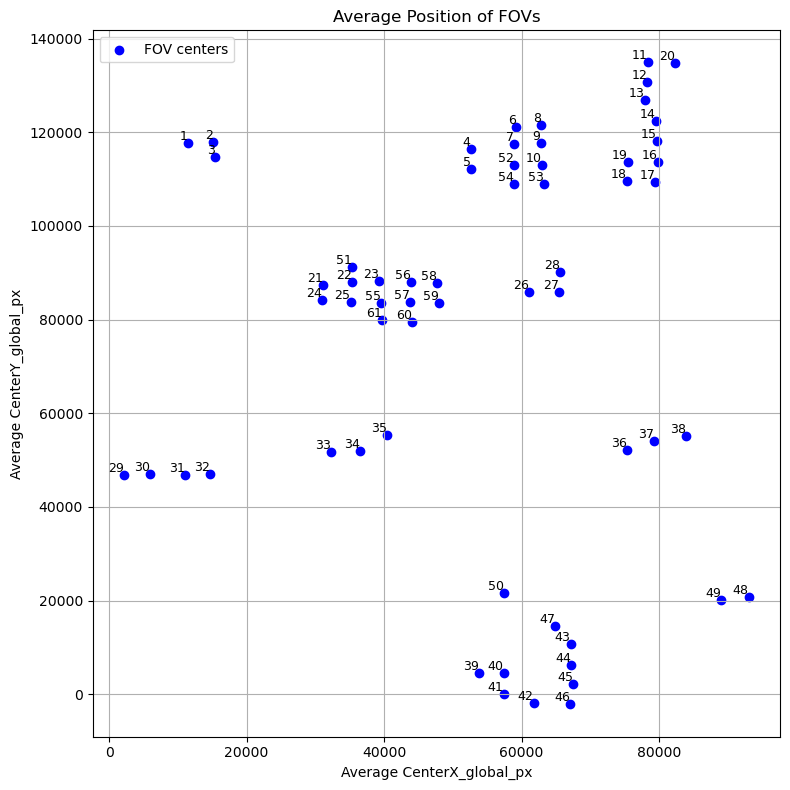

In [8]:
# Prostate
PRT = sc.read('PRT_PROS.h5ad')
RNA = sc.read('RNA_PROS.h5ad')

PRT_name = 'SAHA_CP_PROS_A1_TAP01'
RNA_name = 'SAHA_CR_PROS_A1_TAP01'

PRT = PRT[PRT.obs['SAHA_name']==PRT_name].copy()
RNA = RNA[RNA.obs['SAHA_name']==RNA_name].copy()

PRT.obs['fov'] = PRT_ALL[PRT_ALL.obs['SAHA_name']==PRT_name].obs['fov']
RNA.obs['fov'] = RNA_ALL[RNA_ALL.obs['SAHA_name']==RNA_name].obs['fov']

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(PRT, "spatial", color='celltype_mf', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

RNA.uns['Insitutype_Broad_colors'] = ['#1f77b4', #endo
           '#ff7f0e', #epi
           '#279e68', #ery
           '#d62728', #B
           '#aa40fc', #DC
           '#8c564b', #Other
           '#e377c2', #Plasma
           '#b5bd61', #T
           '#17becf', #Mesen
           '#aec7e8', #Myeloid
           '#ffbb78', #Neuro
           '#ff9896', #Stem
]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(RNA, "spatial", color='Insitutype_Broad', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

fov_avg_positions = RNA.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [9]:
# Update PRT AnnData
PRT.obs['celltype_mf'] = PRT.obs['celltype_mf'].replace('Immune-Other', 'Lymphoid-Other')
# Update RNA AnnData
RNA.obs['Insitutype_Broad'] = RNA.obs['Insitutype_Broad'].replace('Immune-Other', 'Lymphoid-Other')

/tmp/ipykernel_779926/536633814.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  PRT.obs['celltype_mf'] = PRT.obs['celltype_mf'].replace('Immune-Other', 'Lymphoid-Other')
/tmp/ipykernel_779926/536633814.py:4: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  RNA.obs['Insitutype_Broad'] = RNA.obs['Insitutype_Broad'].replace('Immune-Other', 'Lymphoid-Other')


/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


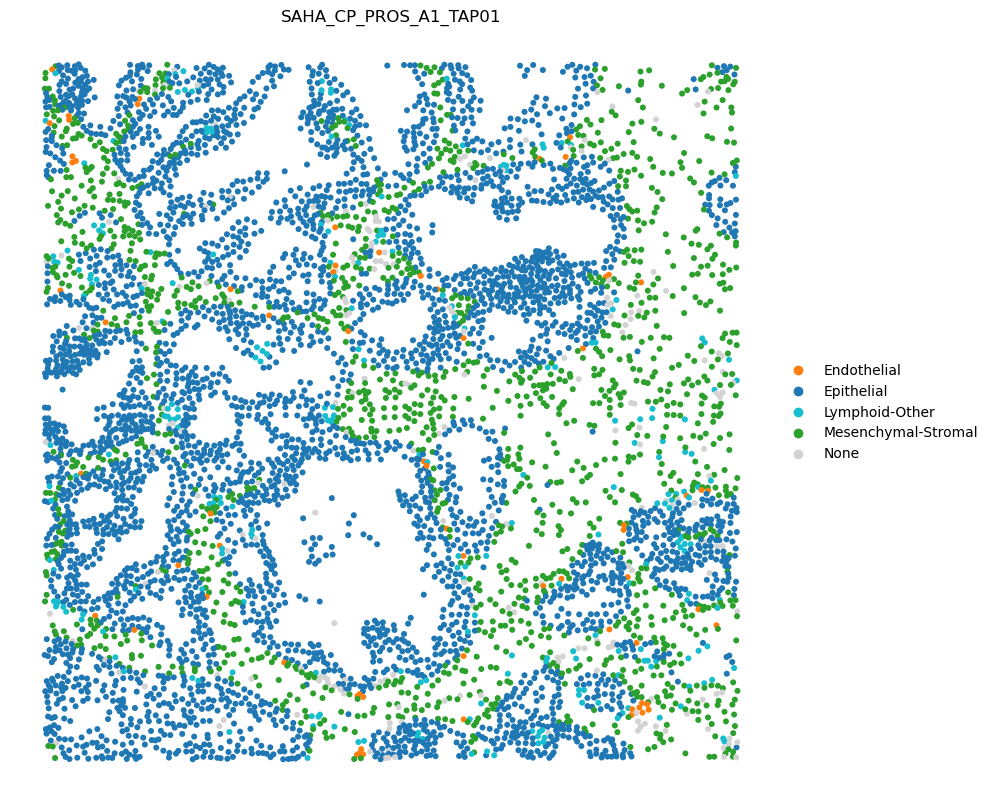

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


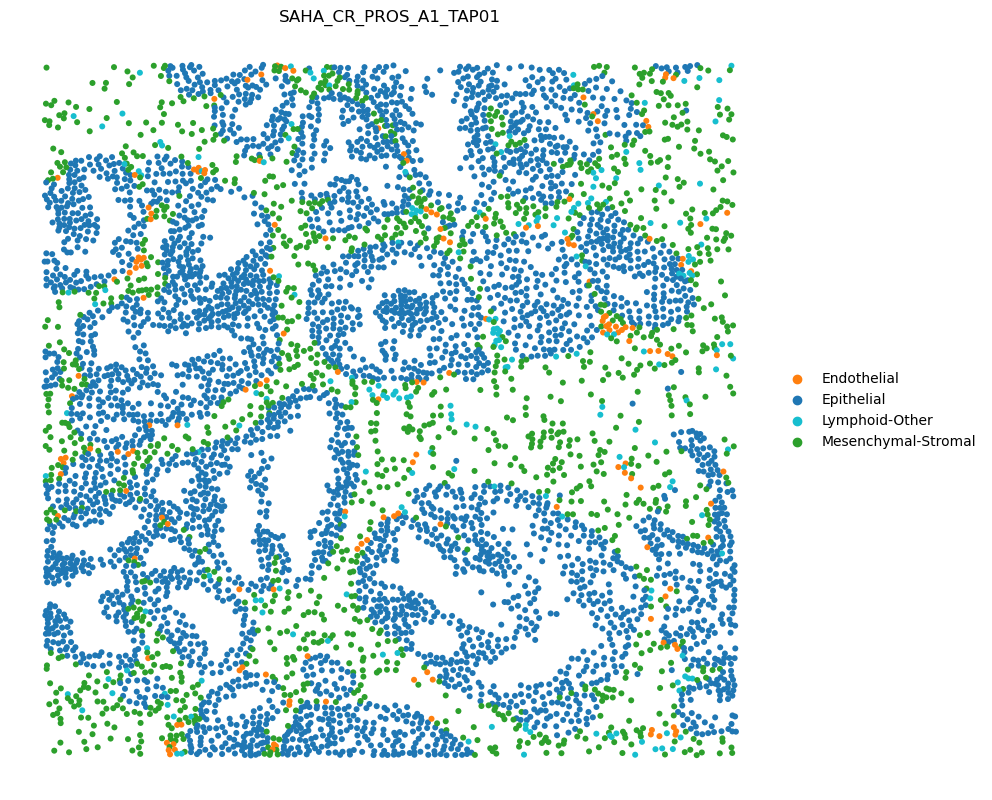

In [10]:
size=75
# fovs = [61,21,22,23,56,58,24,25,55,57,59,61,60]
fovs = [22,23,25,55]
# Define the color palette you want to use
palette_RNA = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#17becf', #Other
           '#2ca02c', #Mesen
]
palette_PRT = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#17becf', #Other
           '#2ca02c', #Mesen
           'lightgray', #None
]

PRT.obs['fov_int'] = pd.to_numeric(PRT.obs['fov'], errors='coerce')
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(PRT[PRT.obs['fov_int'].isin(fovs)], "spatial", color='celltype_mf', ax=ax, s=size, show=False, palette=palette_PRT)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("PROS_PRT.pdf", format='pdf', bbox_inches='tight')
plt.show()

RNA.obs['fov_int'] = pd.to_numeric(RNA.obs['fov'], errors='coerce')
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(RNA[RNA.obs['fov_int'].isin(fovs)], "spatial", color='Insitutype_Broad', ax=ax, s=size, show=False, palette=palette_RNA)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("PROS_RNA.pdf", format='pdf', bbox_inches='tight')
plt.show()

/tmp/ipykernel_44322/1572884140.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()


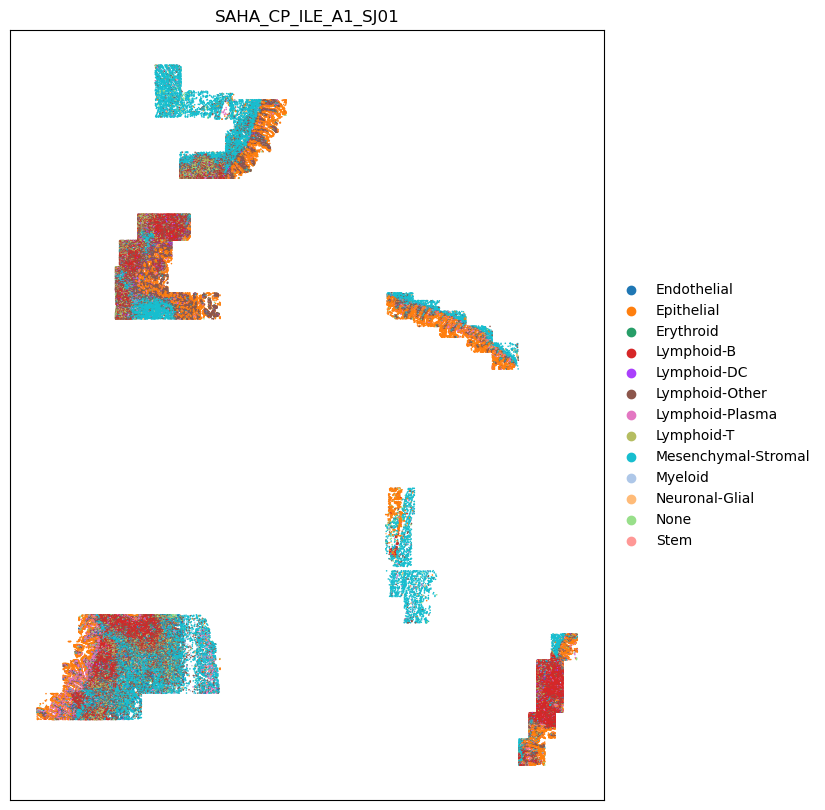

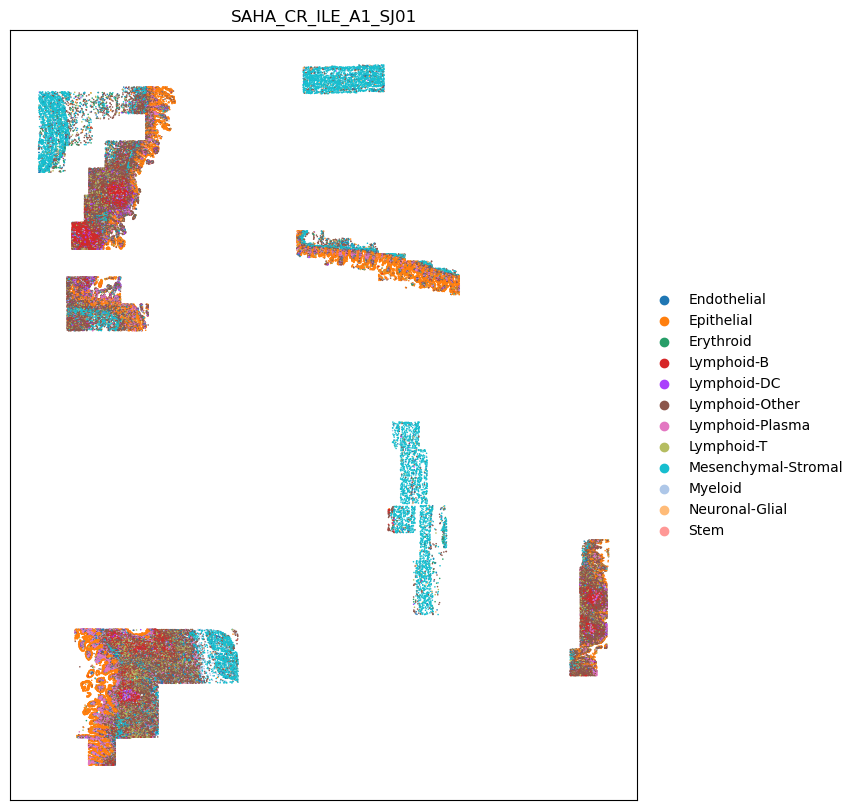

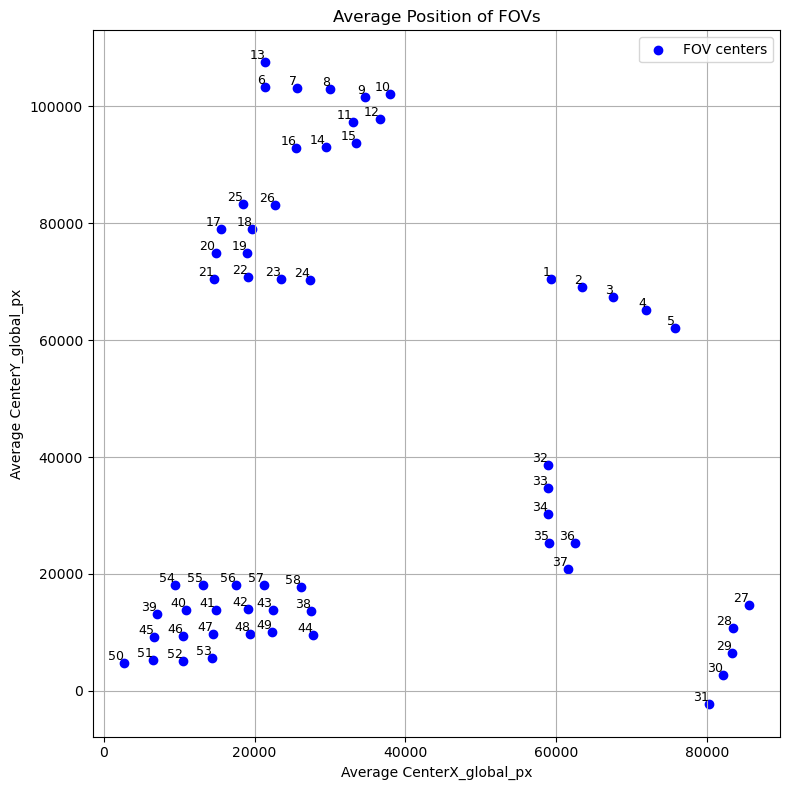

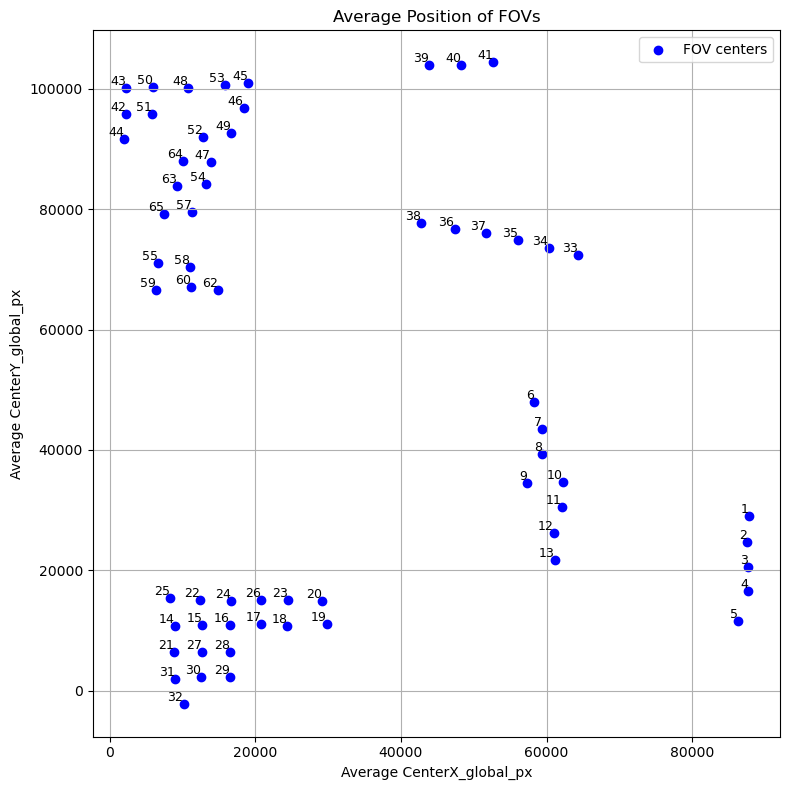

In [10]:
# Ileum
PRT = sc.read('PRT_ILE.h5ad')
RNA = sc.read('RNA_ILE.h5ad')

PRT_name = 'SAHA_CP_ILE_A1_SJ01'
RNA_name = 'SAHA_CR_ILE_A1_SJ01'

PRT = PRT[PRT.obs['SAHA_name']==PRT_name].copy()
RNA = RNA[RNA.obs['SAHA_name']==RNA_name].copy()

PRT.obs['fov'] = PRT_ALL[PRT_ALL.obs['SAHA_name']==PRT_name].obs['fov']
RNA.obs['fov'] = RNA_ALL[RNA_ALL.obs['SAHA_name']==RNA_name].obs['fov']

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(PRT, "spatial", color='celltype_mf', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

RNA.uns['Insitutype_Broad_colors'] = ['#1f77b4', #endo
           '#ff7f0e', #epi
           '#279e68', #ery
           '#d62728', #B
           '#aa40fc', #DC
           '#8c564b', #Other
           '#e377c2', #Plasma
           '#b5bd61', #T
           '#17becf', #Mesen
           '#aec7e8', #Myeloid
           '#ffbb78', #Neuro
           '#ff9896', #Stem
]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(RNA, "spatial", color='Insitutype_Broad', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

fov_avg_positions = RNA.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


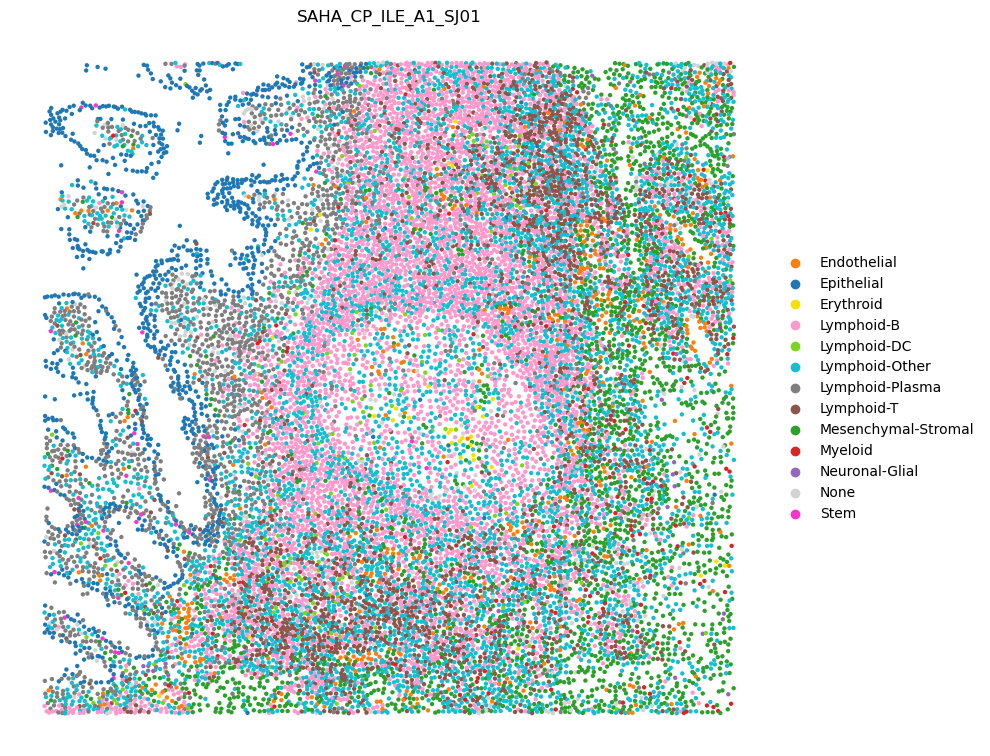

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


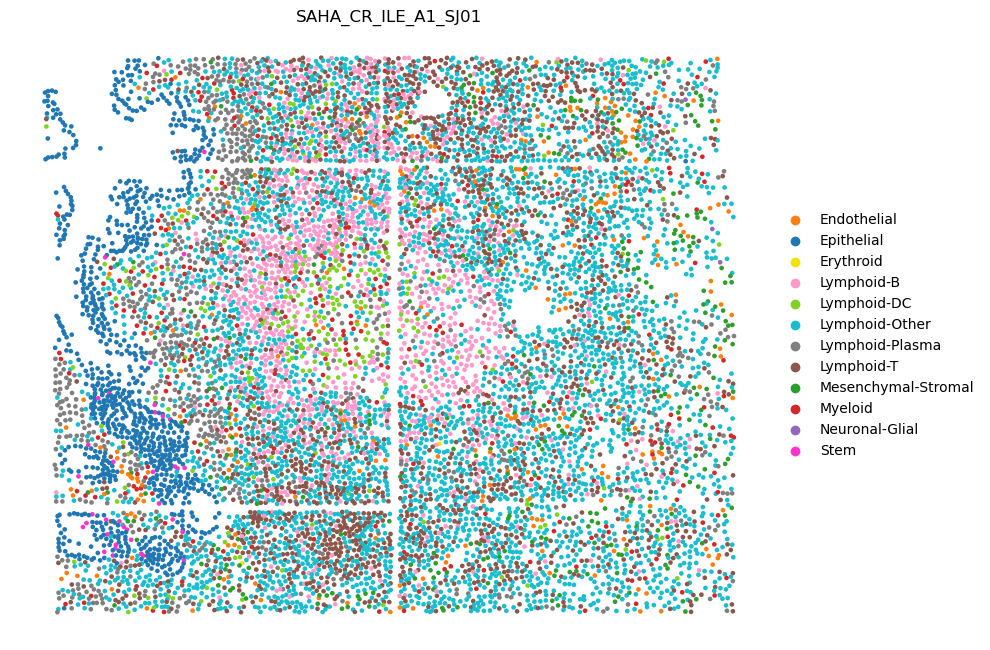

In [11]:
size=40
fovs_PRT = [39,40,41,45,46,47]
fovs_RNA = [15,16,27,28,29,30]
# fovs_PRT = [54,55,56,57,58,39,40,41,42,43,38,45,46,47,48,49,44,50,51,52,53]
# fovs_RNA = [25,22,24,26,23,20,14,15,16,17,18,19,21,27,28,31,30,29,32]
PRT.obs['fov_int'] = pd.to_numeric(PRT.obs['fov'], errors='coerce')

# Define the color palette you want to use
palette_RNA = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#f2e205', #ery
           '#ff99cc', #B
           '#7DD520', #DC
           '#17becf', #Other
           '#7f7f7f', #Plasma
           '#8c564b', #T
           '#2ca02c', #Mesen
           '#d62728', #Myeloid
           '#9467bd', #Neuro
           '#ff33cc', #Stem
]

palette_PRT = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#f2e205', #ery
           '#ff99cc', #B
           '#7DD520', #DC
           '#17becf', #Other
           '#7f7f7f', #Plasma
           '#8c564b', #T
           '#2ca02c', #Mesen
           '#d62728', #Myeloid
           '#9467bd', #Neuro
           'lightgray', #None
           '#ff33cc', #Stem
]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

PRT_sub = PRT[(PRT.obs['fov_int'].isin(fovs_PRT)) & 
             (PRT.obs['CenterX_global_px'] >= 6000) &
             (PRT.obs['CenterX_global_px'] <= 15000)]

sc.pl.embedding(PRT_sub, "spatial", color='celltype_mf', ax=ax, s=size, show=False, palette=palette_PRT)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("ILE_PRT.pdf", format='pdf', bbox_inches='tight')
plt.show()

RNA.obs['fov_int'] = pd.to_numeric(RNA.obs['fov'], errors='coerce')
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

RNA_sub = RNA[(RNA.obs['fov_int'].isin(fovs_RNA)) & 
             (RNA.obs['CenterY_global_px'] >= 3000) &
             (RNA.obs['CenterY_global_px'] <= 10000)]

sc.pl.embedding(RNA_sub, "spatial", color='Insitutype_Broad', ax=ax, s=45, show=False, palette=palette_RNA)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("ILE_RNA.pdf", format='pdf', bbox_inches='tight')
plt.show()

In [7]:
print(RNA[RNA.obs['fov_int'].isin(fovs_RNA)].obs['CenterY_global_px'].min())
print(RNA[RNA.obs['fov_int'].isin(fovs_RNA)].obs['CenterY_global_px'].max())

45.9999472346812
12913.9998409165


/tmp/ipykernel_44322/1463564673.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()


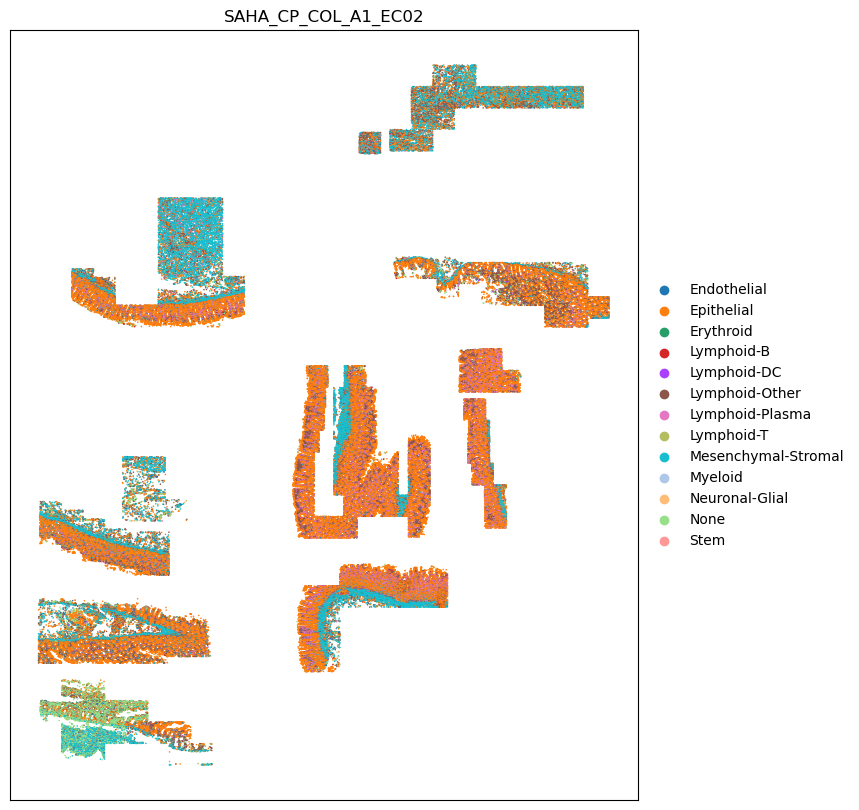

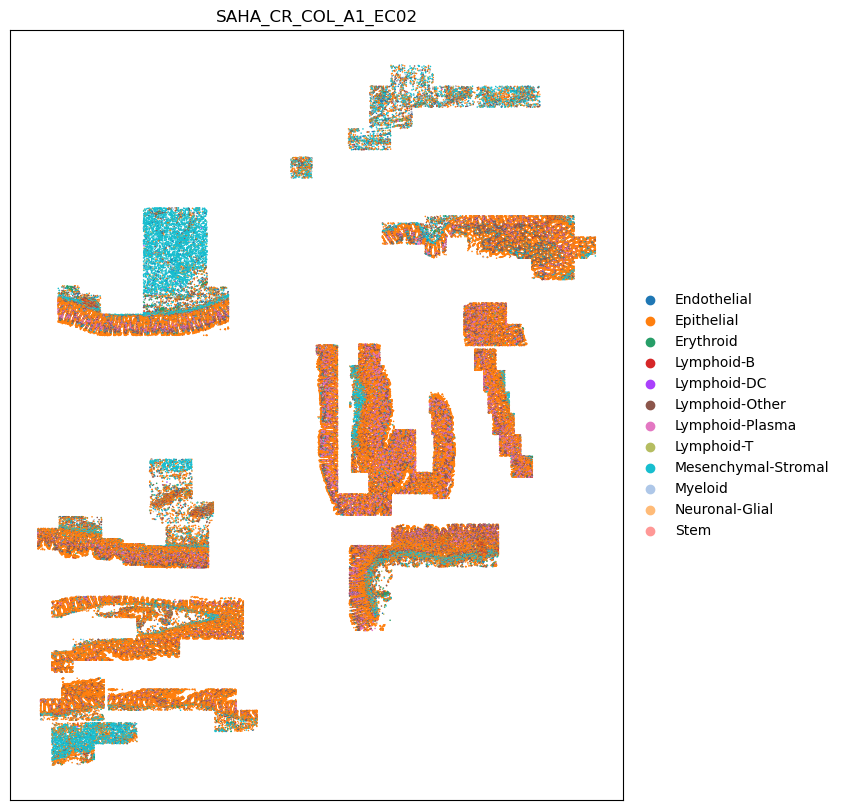

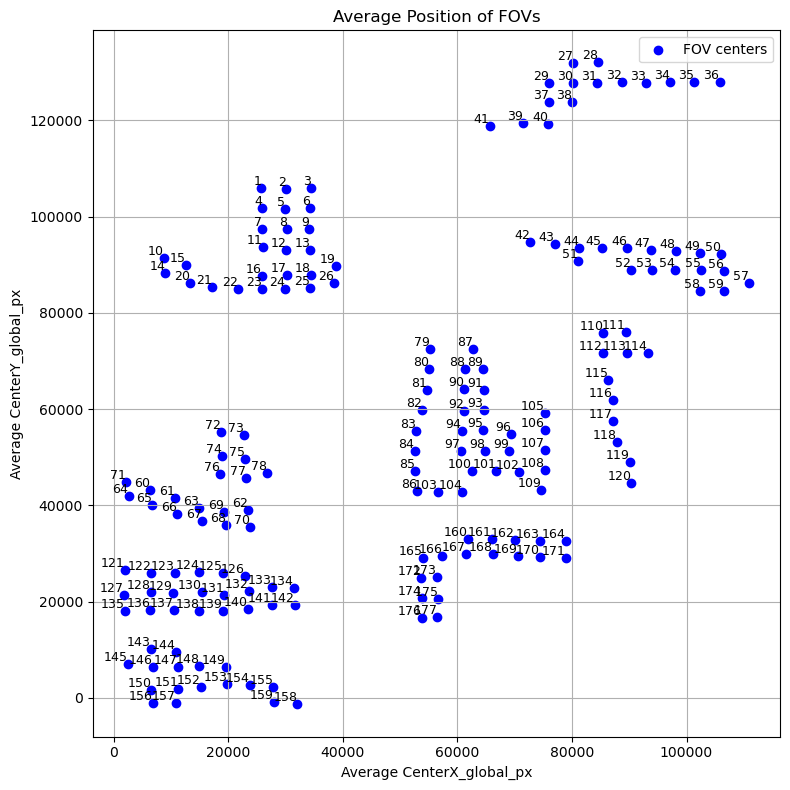

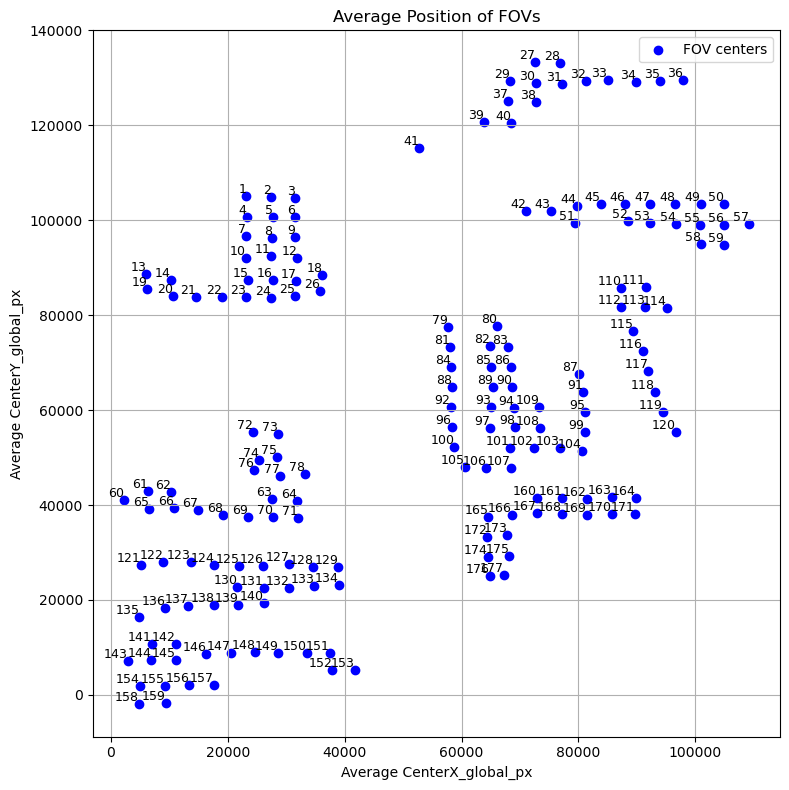

In [12]:
# Colon
PRT = sc.read('PRT_COL.h5ad')
RNA = sc.read('RNA_COL.h5ad')

PRT_name = 'SAHA_CP_COL_A1_EC02'
RNA_name = 'SAHA_CR_COL_A1_EC02'

PRT = PRT[PRT.obs['SAHA_name']==PRT_name].copy()
RNA = RNA[RNA.obs['SAHA_name']==RNA_name].copy()

PRT.obs['fov'] = PRT_ALL[PRT_ALL.obs['SAHA_name']==PRT_name].obs['fov']
RNA.obs['fov'] = RNA_ALL[RNA_ALL.obs['SAHA_name']==RNA_name].obs['fov']

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(PRT, "spatial", color='celltype_mf', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

RNA.uns['Insitutype_Broad_colors'] = ['#1f77b4', #endo
           '#ff7f0e', #epi
           '#279e68', #ery
           '#d62728', #B
           '#aa40fc', #DC
           '#8c564b', #Other
           '#e377c2', #Plasma
           '#b5bd61', #T
           '#17becf', #Mesen
           '#aec7e8', #Myeloid
           '#ffbb78', #Neuro
           '#ff9896', #Stem
]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(RNA, "spatial", color='Insitutype_Broad', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

fov_avg_positions = RNA.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


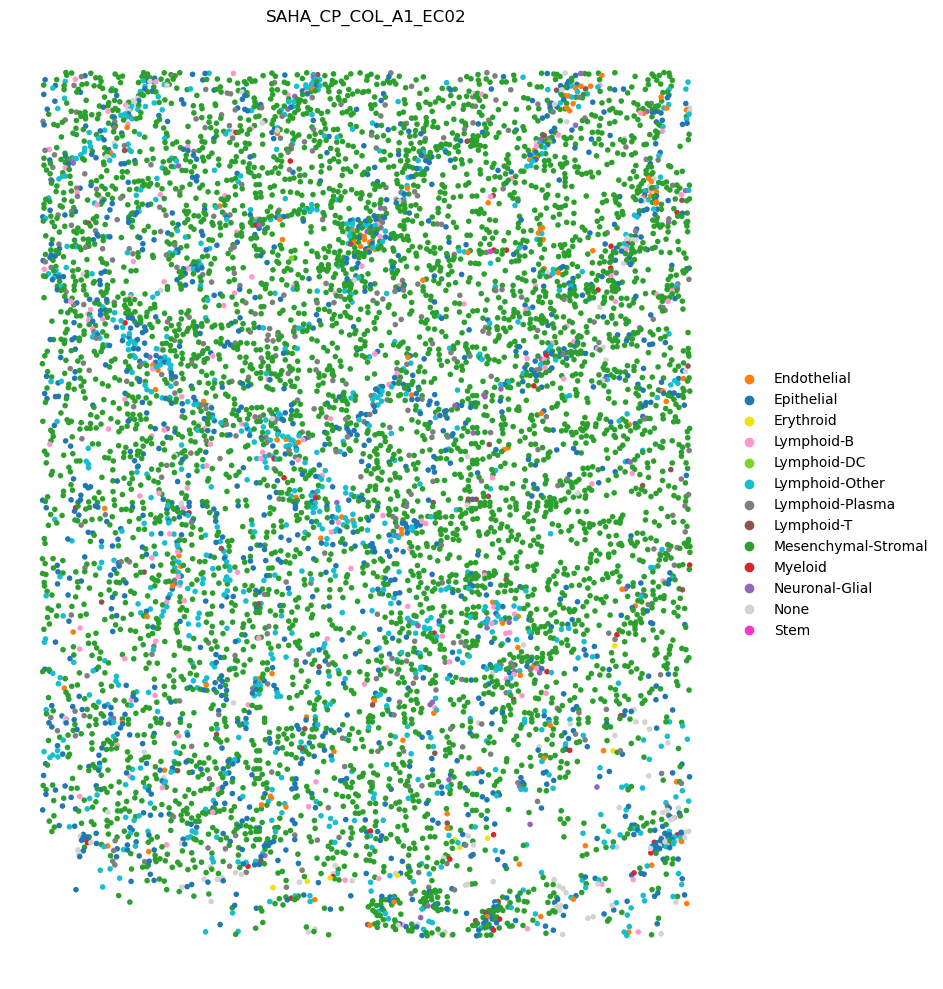

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


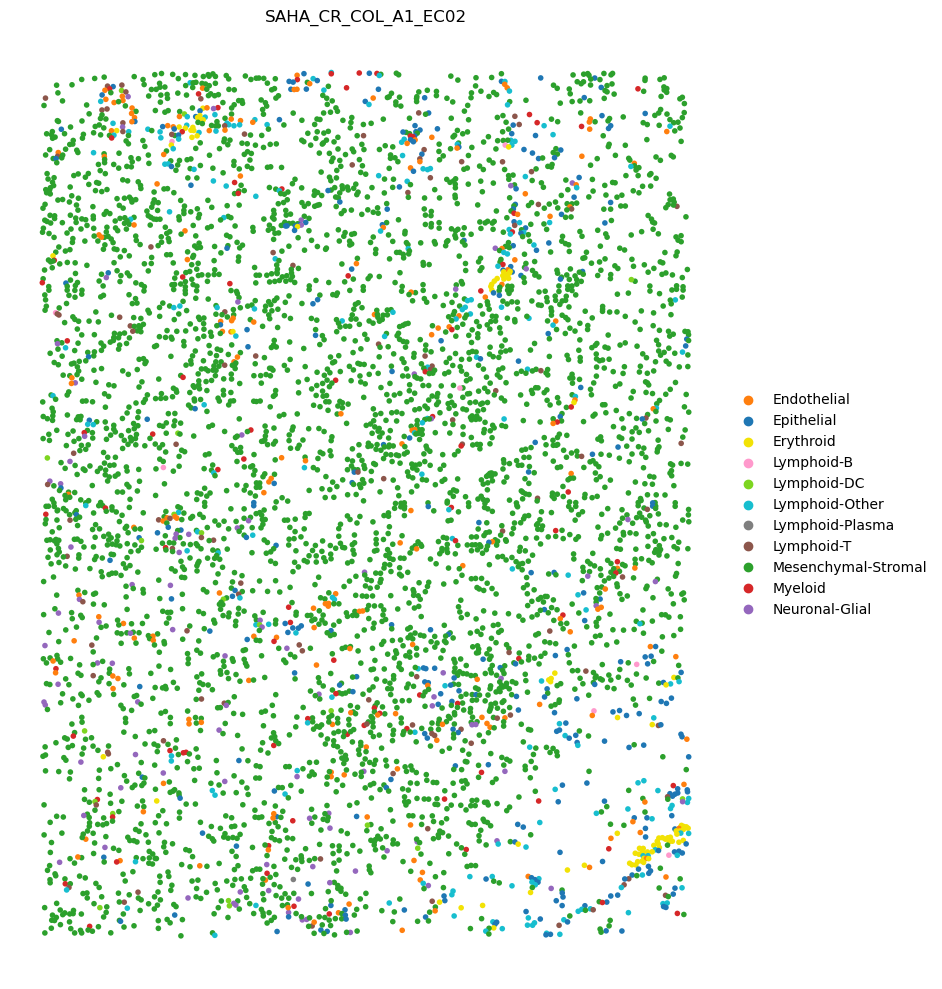

In [18]:
size=65

# fovs_PRT = [42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59]
# fovs_RNA = [42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59]

# fovs_PRT = [79,80,81,82]
# fovs_RNA = [79,81,84,88]

# fovs_PRT = [79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109]
# fovs_RNA = [79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107]

fovs_PRT = [1,2,3,4,5,6,7,8,9,11,12,13]
fovs_RNA = [1,2,3,4,5,6,7,8,9,10,11,12]

# fovs_PRT = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26]
# fovs_RNA = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26]

# fovs_PRT = [72,73,74,75,76,77,78,71,60,61,63,69,62,64,65,66,67,68,70]
# fovs_RNA = [72,73,74,75,76,77,78,60,61,62,63,64,65,66,67,68,69,70,71]
PRT.obs['fov_int'] = pd.to_numeric(PRT.obs['fov'], errors='coerce')

# Define the color palette you want to use
palette_RNA = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#f2e205', #ery
           '#ff99cc', #B
           '#7DD520', #DC
           '#17becf', #Other
           '#7f7f7f', #Plasma
           '#8c564b', #T
           '#2ca02c', #Mesen
           '#d62728', #Myeloid
           '#9467bd', #Neuro
           '#ff33cc', #Stem
]

palette_PRT = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#f2e205', #ery
           '#ff99cc', #B
           '#7DD520', #DC
           '#17becf', #Other
           '#7f7f7f', #Plasma
           '#8c564b', #T
           '#2ca02c', #Mesen
           '#d62728', #Myeloid
           '#9467bd', #Neuro
           'lightgray', #None
           '#ff33cc', #Stem
]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(PRT[PRT.obs['fov_int'].isin(fovs_PRT)], "spatial", color='celltype_mf', ax=ax, s=size, show=False, palette=palette_PRT)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("COL_PRT2.pdf", format='pdf', bbox_inches='tight')
plt.show()


RNA.obs['fov_int'] = pd.to_numeric(RNA.obs['fov'], errors='coerce')
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(RNA[RNA.obs['fov_int'].isin(fovs_RNA)], "spatial", color='Insitutype_Broad', ax=ax, s=size, show=False, palette=palette_RNA)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("COL_RNA2.pdf", format='pdf', bbox_inches='tight')
plt.show()

/tmp/ipykernel_786640/1915037839.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()


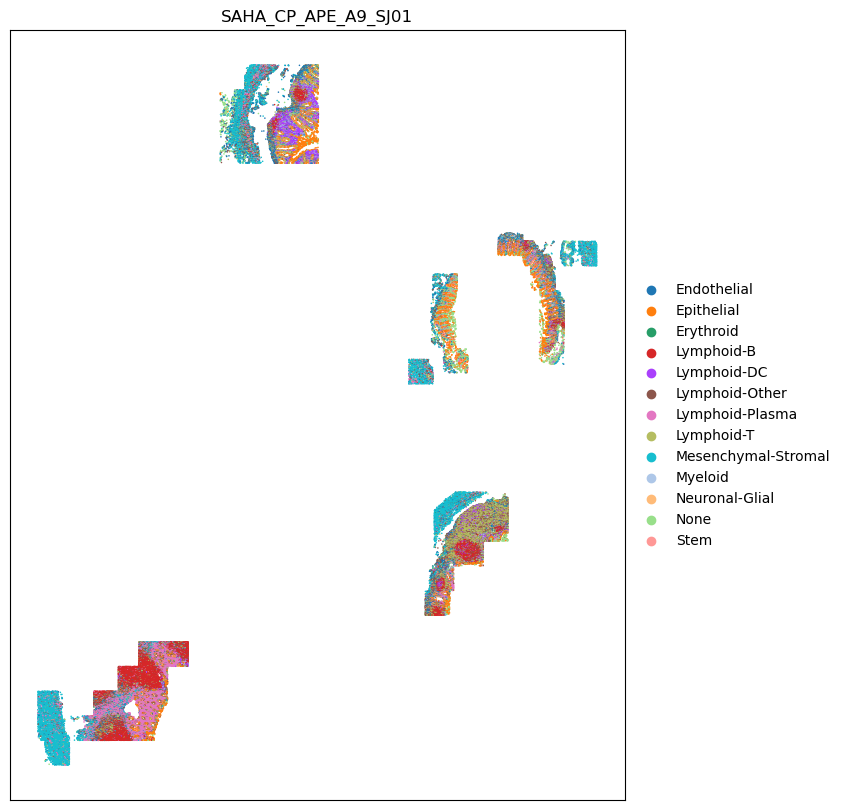

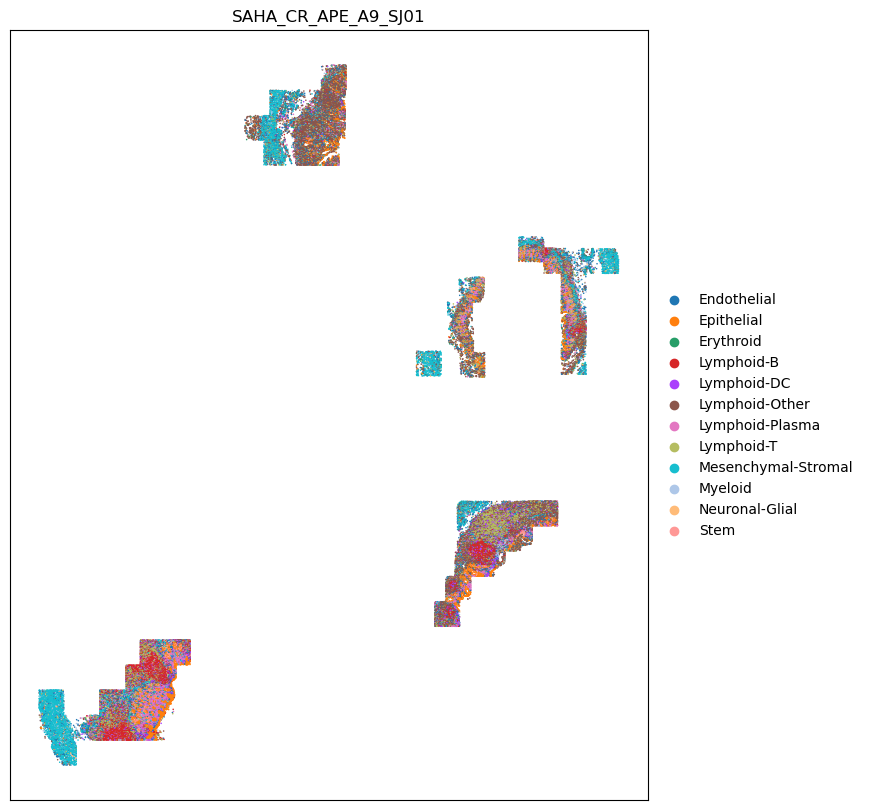

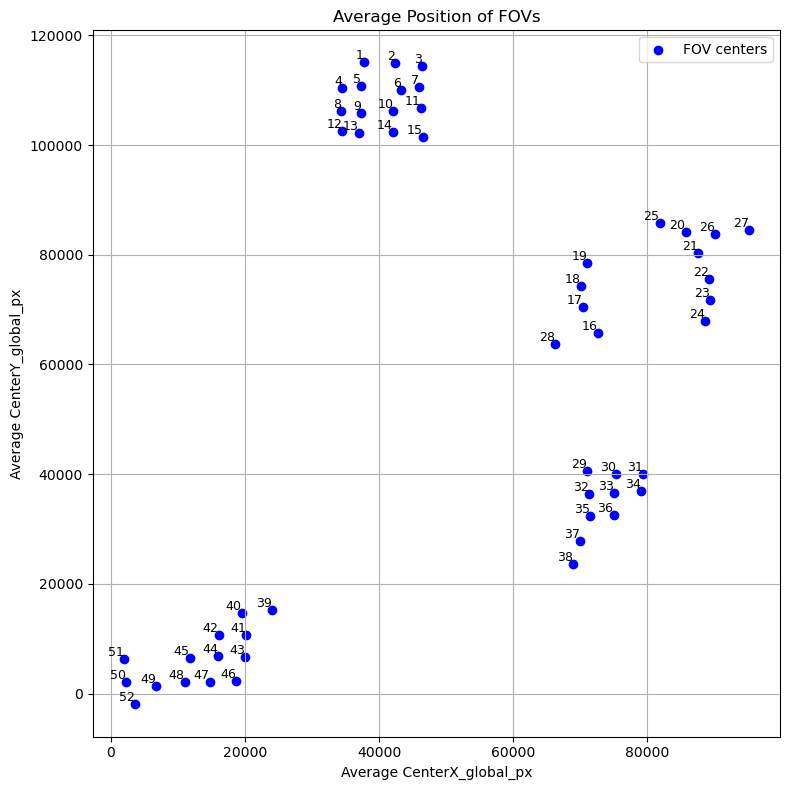

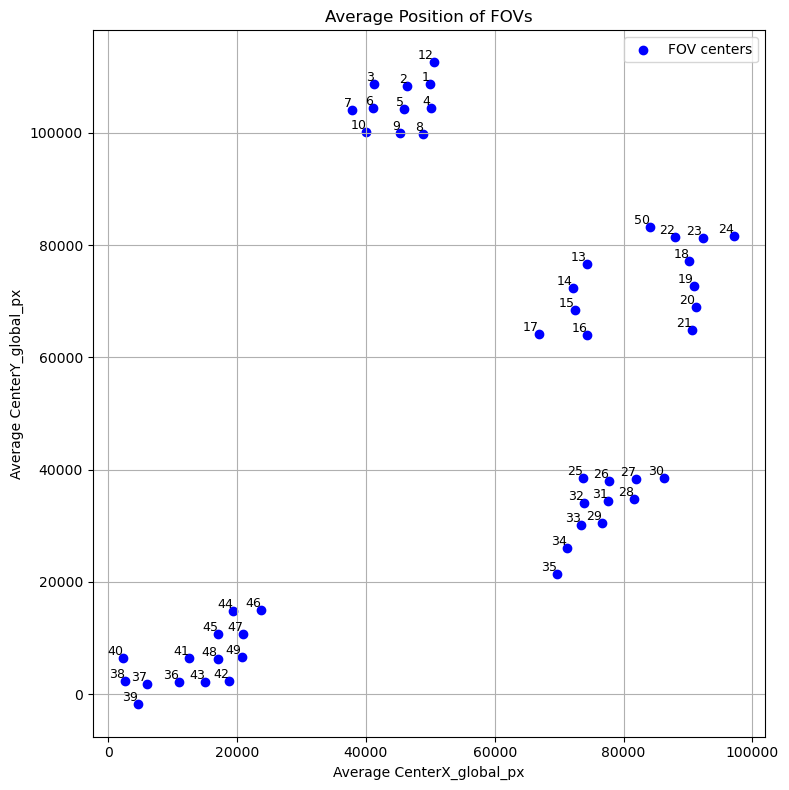

In [4]:
# Appendix
PRT = sc.read('PRT_APE.h5ad')
RNA = sc.read('RNA_APE.h5ad')

PRT_name = 'SAHA_CP_APE_A9_SJ01'
RNA_name = 'SAHA_CR_APE_A9_SJ01'

PRT = PRT[PRT.obs['SAHA_name']==PRT_name].copy()
RNA = RNA[RNA.obs['SAHA_name']==RNA_name].copy()

PRT.obs['fov'] = PRT_ALL[PRT_ALL.obs['SAHA_name']==PRT_name].obs['fov']
RNA.obs['fov'] = RNA_ALL[RNA_ALL.obs['SAHA_name']==RNA_name].obs['fov']

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(PRT, "spatial", color='celltype_mf', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

RNA.uns['Insitutype_Broad_colors'] = ['#1f77b4', #endo
           '#ff7f0e', #epi
           '#279e68', #ery
           '#d62728', #B
           '#aa40fc', #DC
           '#8c564b', #Other
           '#e377c2', #Plasma
           '#b5bd61', #T
           '#17becf', #Mesen
           '#aec7e8', #Myeloid
           '#ffbb78', #Neuro
           '#ff9896', #Stem
]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(RNA, "spatial", color='Insitutype_Broad', ax=ax, s=5, show=False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

fov_avg_positions = PRT.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

fov_avg_positions = RNA.obs.groupby('fov')[['CenterX_global_px', 'CenterY_global_px']].mean()

# Plotting
plt.figure(figsize=(8, 8))
plt.scatter(fov_avg_positions['CenterX_global_px'], fov_avg_positions['CenterY_global_px'], c='blue', label='FOV centers')

# Label each point with its FOV number
for fov, (x, y) in fov_avg_positions.iterrows():
    plt.text(x, y, str(fov), fontsize=9, ha='right', va='bottom')

# Adding labels and title
plt.xlabel('Average CenterX_global_px')
plt.ylabel('Average CenterY_global_px')
plt.title('Average Position of FOVs')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


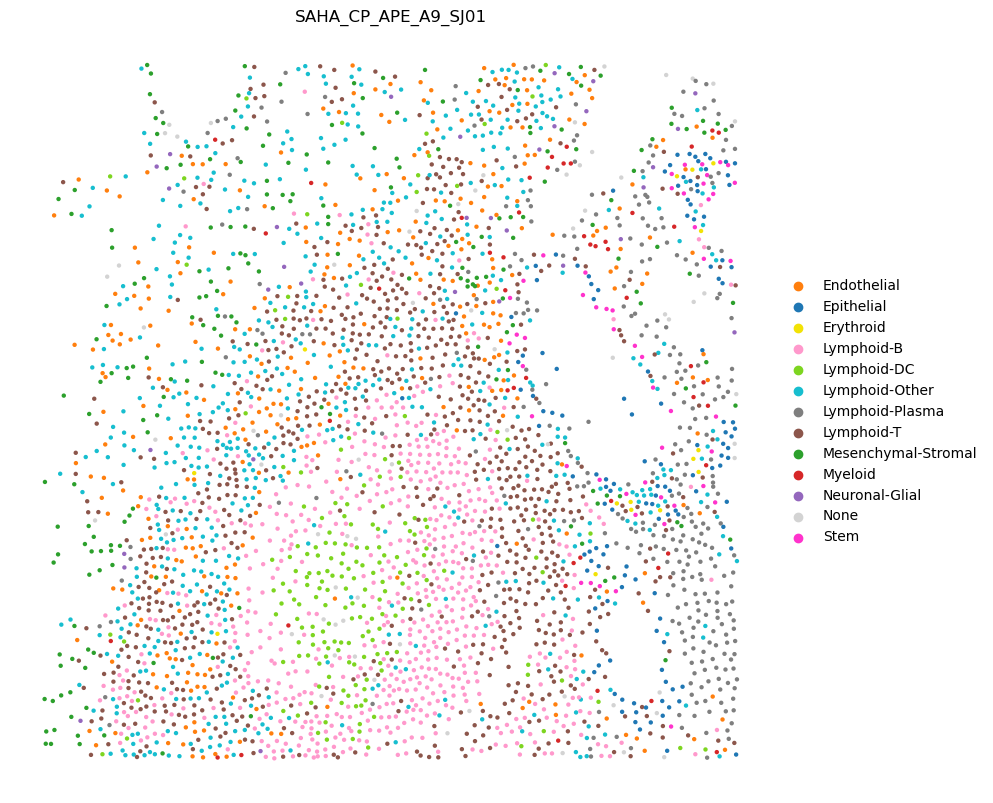

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


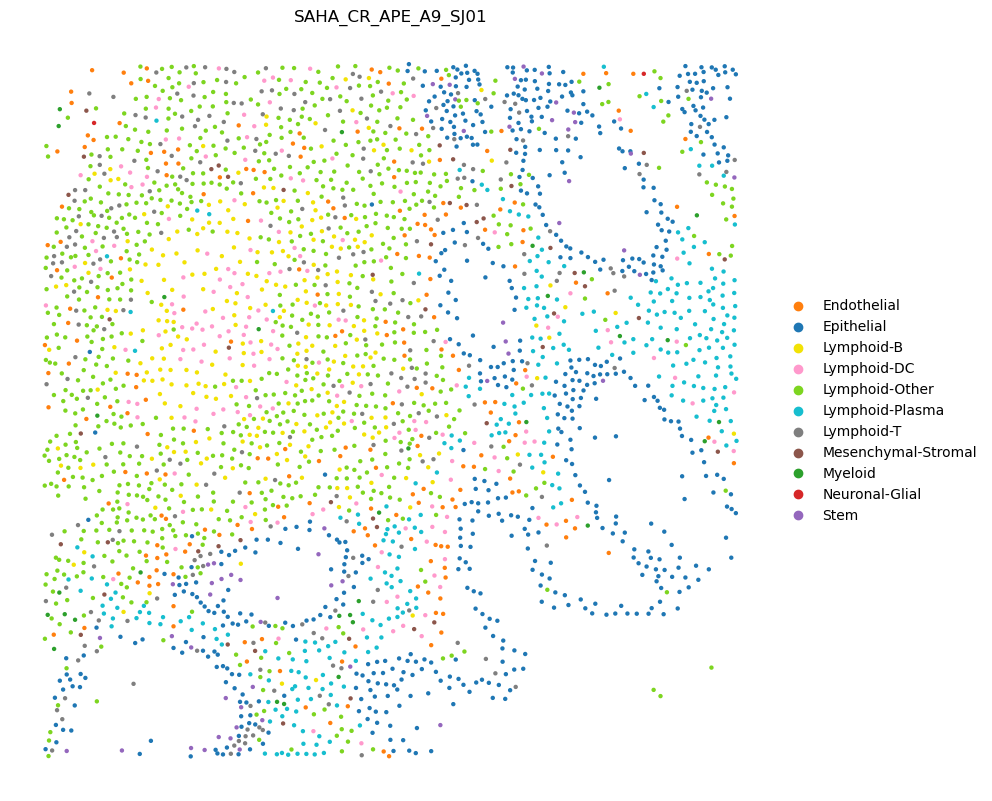

In [5]:
size=40

# fovs_PRT = [20,21,22,23,24,25,26,27]
# fovs_RNA = [18,19,20,21,22,23,24,50]

fovs_PRT = [37]
fovs_RNA = [34]

# fovs_PRT = [32,33,35,36]
# fovs_RNA = [29,31,32,33]

# fovs_PRT = [29,30,31,32,33,34,35,36,37,38]
# fovs_RNA = [25,26,27,28,29,30,31,32,33,34,35]

# fovs_PRT = [39,40,41,42,43,44,45,46,47,48,49,50,51,52]
# fovs_RNA = [36,37,38,39,40,41,42,43,44,45,46,47,48,49]

# Define the color palette you want to use
palette_RNA = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#f2e205', #ery
           '#ff99cc', #B
           '#7DD520', #DC
           '#17becf', #Other
           '#7f7f7f', #Plasma
           '#8c564b', #T
           '#2ca02c', #Mesen
           '#d62728', #Myeloid
           '#9467bd', #Neuro
           '#ff33cc', #Stem
]

palette_PRT = ['#ff7f0e', #endo
           '#1f77b4', #epi
           '#f2e205', #ery
           '#ff99cc', #B
           '#7DD520', #DC
           '#17becf', #Other
           '#7f7f7f', #Plasma
           '#8c564b', #T
           '#2ca02c', #Mesen
           '#d62728', #Myeloid
           '#9467bd', #Neuro
           'lightgray', #None
           '#ff33cc', #Stem
]

PRT.obs['fov_int'] = pd.to_numeric(PRT.obs['fov'], errors='coerce')
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

'''PRT_sub = PRT[(PRT.obs['fov_int'].isin(fovs_PRT)) & 
             (PRT.obs['CenterX_global_px'] >= 70000) &
             (PRT.obs['CenterY_global_px'] <= 37000)]'''

# sc.pl.embedding(PRT_sub, "spatial", color='celltype_mf', ax=ax, s=size, show=False, palette=palette_PRT)
sc.pl.embedding(PRT[PRT.obs['fov_int'].isin(fovs_PRT)], "spatial", color='celltype_mf', ax=ax, s=size, show=False, palette=palette_PRT)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(PRT_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("APE_PRT2.pdf", format='pdf', bbox_inches='tight')
plt.show()

RNA.obs['fov_int'] = pd.to_numeric(RNA.obs['fov'], errors='coerce')
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.embedding(RNA[RNA.obs['fov_int'].isin(fovs_RNA)], "spatial", color='Insitutype_Broad', ax=ax, s=size, show=False, palette=palette_RNA)

# Customize the plot
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_facecolor('white')
ax.set_title(RNA_name)

# Remove the spines (borders)
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("APE_RNA2.pdf", format='pdf', bbox_inches='tight')
plt.show()

In [68]:
print(PRT[PRT.obs['fov_int'].isin(fovs_PRT)].obs['CenterX_global_px'].min())
print(PRT[PRT.obs['fov_int'].isin(fovs_PRT)].obs['CenterY_global_px'].max())

68609.3741558733
38746.389632606
